# Lecture 7: k-means and dimensionality reduction via the Johnson–Lindenstrauss lemma

In [1]:
#Lots of imports for today
from IPython import display
import numpy
import math
from PIL import Image
import itertools
import random
import matplotlib.pyplot as plt
from matplotlib.offsetbox import OffsetImage, AnnotationBbox
import matplotlib.cm

The *clustering* problem is the problem to partition data into groups, so that the groups somehow make sense.

Here is an example of a data set where the data appears to fall groups (and if you look at the code it is generated with four normal distributions). Can we find some way to groups the data automatically?

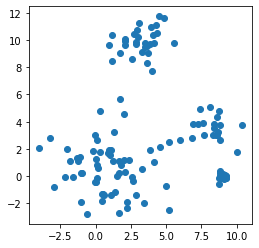

In [2]:
def twodnormal(center,sigma,count):
    return [ (random.normalvariate(center[0],sigma),
              random.normalvariate(center[1],sigma)) for i in range(count)]

def scatter(A):
    x=[a[0]  for a in A]
    y=[a[1]  for a in A]
    fig, ax = plt.subplots(figsize=(4, 4))
    ax.scatter(x, y) 
    
scatter(twodnormal( (8,4) ,1,20)+twodnormal( (1,1) ,2,60)+twodnormal( (3,10) ,1,30)+twodnormal( (9,0) ,0.2,20))

First we need to settle on the goal, and then talk about the algorithm. 

The goal will be, given $k$, to find $k$ points, called the *means*, such that the sum of the distances from each point to the nearest mean is minimized. This clustering method works well with some types of data, but I must point out it works poorly for others. For example, in the next plot, the points  clearly form two groups, but $k$-means, with $k-2$ will not give the desired results:

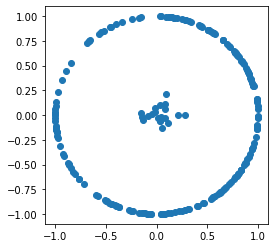

In [3]:
scatter( [( math.sin(x),math.cos(x) )  for x in (10*random.random() for i in range(200))]
        +twodnormal( (0,0) ,0.1,20))


Computing the optimal solution to the $k$-means problem in NP-hard. However, there is a simple method that works well in practice:

- Start with $k$ random data points chosen as the means
- Repeat:
    - Assign each data point to the closest mean
    - Recompute each mean as the mean (centroid) of the points for which it is the closest

This converges if Euclidian distance is used, though there is no guarantee that it converges on the optimal solution. The quality of a solution is measured by the sum of each point's distance to its closest mean. So, usually this is run several times, and the best solution is returned.


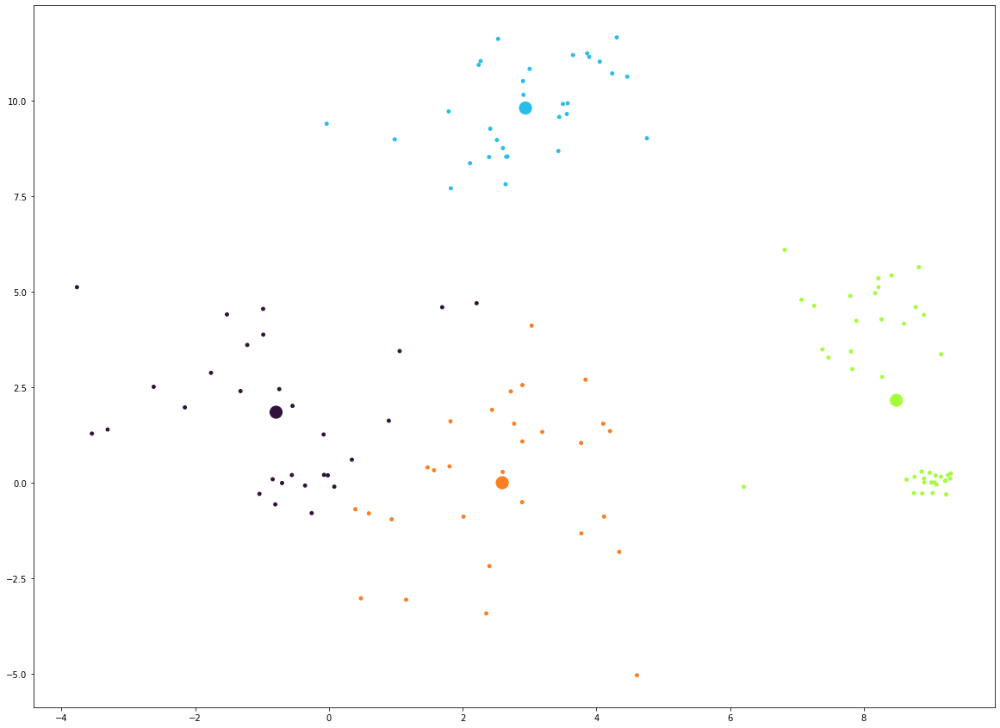

In [4]:
def distance(X,Y): # returns the square of the eulidan distance
    return sum( (x-y)*(x-y) for x,y in zip(X,Y))

def argmin(X): # returns the index of a the smallest item
    return min(range(len(X)), key=X.__getitem__)
#print(argmin([1,2,3,0,4]))

def centroid(X): 
    c=[0]*len(X[0])
    for x in X:
        for i in range(len(x)):
            c[i]+=x[i]
    for i in range(len(x)):
        c[i]/=len(X)
    return c

def kmeans(data,k,iterations=10): # a more sophisticated version would test for convergence
    means=random.sample(data,k)
    for trial in range(iterations): #main loop
        closestMean=[argmin([distance(mean,d) for mean in means]) for d in data]
        pointsWithClosestMean=[list() for i in range(k)]
        for d,m in zip(data,closestMean):
            pointsWithClosestMean[m].append(d)
        means=[centroid(pointsWithClosestMean[m]) for m in range(k)]
        
    # The rest is jsut getting the data in the right format to return
    # We return a pair with
    #    A list of the means
    #    A mapping of the index of each mean to the index of the data items for which this mean is the closest
    closestMean=[argmin([distance(mean,d) for mean in means]) for d in data]
    pointsWithClosestMean=[list() for i in range(k)]
    for d,m in zip(range(len(data)),closestMean):
        pointsWithClosestMean[m].append(d)
    return means,pointsWithClosestMean

def quality(data,means,pointsWithClosestMean):
    s=0
    for m in range(len(means)):
        for p in pointsWithClosestMean[m]:
            s+=distance(means[m],data[p])
    return s

def repeatkmeans(data,k,trials=10,iterations=10):
    results=[]
    for i in range(iterations):
        km,pwkm=kmeans(data,k,iterations)
        results.append( (quality(data,km,pwkm),(km,pwkm)) ) 
        #print(quality(data,km,pwkm))
    return min(results,key=lambda x:x[0])[1]
        
def plotkmeans(data,k,trials,iterations):
    km,pwkm=repeatkmeans(data,k,trials,iterations)
    nx=[]
    ny=[]
    sizes=[]
    cols=[]
    cm=matplotlib.cm.get_cmap('turbo')
    for m,P,c in zip(km,pwkm,[cm(i/len(km)) for i in range(len(km))]):
        nx.append(m[0])
        ny.append(m[1])
        cols.append(c)
        sizes.append(200)
        nx.extend(data[p][0] for p in P)
        ny.extend(data[p][1] for p in P)
        cols.extend([c]*len(P))
        sizes.extend([15]*len(P))

    fig, ax = plt.subplots(figsize=(20, 15))
    ax.scatter(nx, ny,sizes,cols) 

data=twodnormal( (8,4) ,1,20)+twodnormal( (1,1) ,2,60)+twodnormal( (3,10) ,1,30)+twodnormal( (9,0) ,0.2,20)
plotkmeans(data,4,100,20)

## Runtime

Suppose you have $n$ items, each in $d$ dimensions, and you are looking for $k$ means.

Each iteration of $k$-means takes time $O(dnk)$. We need to multiply this by the number of trials and the time to converge, but this is usually small in practice.

For small dimension and number of means, this works well.

# Dimensionality reduction

There is something known as the *curse of dimensionality* whereby many algorithms take time that depend on the dimension. For some, like $k$ means as described above, this is linear. But often is is worse, and an exponential dependence on dimension is quit common. Much of our intuition for 2D and 3D does not carry over into higher dimension, as many things we thing of a linear are in fact $O(n^{\lfloor d/2 \rfloor})$, which happens to be $O(n)$ for $d=2$ and $d=3$ but in general depends exponentially on the dimensions.

However to counteract this, techniques have been developed to reduce the dimensionality of high dimensional data. Surprisingly, such methods are simple and work well. The standard method is known as the Johnson–Lindenstrauss lemma, which says that you can use roughly $O(\log n)$ dimensions and preserve distances approximately. 

There is a function $JL:\mathbb{R}^d \mapsto \mathbb{R}^k$ such that for any set $S$ of $n$ points in $\mathbb{R}^d$, and for any $x,y \in S$, if $k\geq \frac{20 \ln n}{\epsilon^2}$:

$$ (1+\epsilon) d(JL(x),JL(y)) 
 \leq d(x,y)  \leq (1+\epsilon) d(JL(x),JL(y))$$

where $d$ is the Euclidean distance.

How can we find such a function? It turns out that there are many that work. Originally, a random projector was used, this was simplified to using a matrix $d \times k$ matrix $M$ whose entries are Gaussians and setting $JL(X)=Mx$. Most simply, it was realized that a random $-1,1$ matrix works well. Specifically with a failure probability of $\delta$, a random $-1,1$ matrix works when $k$ is:

$$ k \geq \frac{4+2\delta}{\epsilon^2/2 + \epsilon^3/3} \ln n$$ 



For the proof that it works with -1/1 see [here](https://www.sciencedirect.com/science/article/pii/S0022000003000254). For a supposedly simple proof using gaussans, see [here](http://citeseerx.ist.psu.edu/viewdoc/download?doi=10.1.1.106.6717&rep=rep1&type=pdf). I will be skipping the proofs as none are really simple to be worth the time it will take to present them. I note that this is just the tip of the iceberg, there has been much work to make JL efficient, and in particular for sparse matricies.

I also note the JL is known to be tight up to the constant.

Here is code to compute the dimension needed and the JL transformation itself.

In [5]:
def dimensionNeeded(n,epsilon,delta):
    return (4+2*delta )*math.log(n)/(epsilon**2/2+epsilon**3/2)

In [6]:
class JL:
    def __init__(self,fromd,tod):
        self._fromd=fromd
        self._tod=tod
        self._A=numpy.array([ [random.choice([-1,1]) for i in range(fromd)] for i in range(tod)])
    def transform(self,B):
        return numpy.matmul(self._A,B)

## Example: flower images

Here I will show how we can use JL combined with k-means to classify flower images. These images will be viewed as points in 65536-dimension space, and we will use JL to reduce this and then run k-means.

First we need to load and process the data so that each image is simply an array. We also have the pictures themselves to help visualize.

In [7]:
#https://www.kaggle.com/olgabelitskaya/flower-color-images

def flowerfilenames():
    path="data/flowers/flower_images/flower_images/"
    return (path+'{0:04d}'.format(i)+'.png' for i in itertools.chain(range(1,208),range(209,211)))

Photos=[display.Image(filename=f) for f in flowerfilenames()]
Photos2=[OffsetImage(plt.imread(f)) for f in flowerfilenames()]
PhotoData=[ numpy.asarray(Image.open(f)) for f in flowerfilenames()]


def flatten(A):
    if isinstance(A,list) or isinstance(A,numpy.ndarray):
        for x in A:
            yield from flatten(x)
    else:
        yield A
#print([x for x in flatten([1,[[2],3],4])])


PhotoData=numpy.array(list(map(lambda x:list(flatten(x)),PhotoData)))


In [8]:
for pd in PhotoData:
    print(len(pd))

65536
65536
65536
65536
65536
65536
65536
65536
65536
65536
65536
65536
65536
65536
65536
65536
65536
65536
65536
65536
65536
65536
65536
65536
65536
65536
65536
65536
65536
65536
65536
65536
65536
65536
65536
65536
65536
65536
65536
65536
65536
65536
65536
65536
65536
65536
65536
65536
65536
65536
65536
65536
65536
65536
65536
65536
65536
65536
65536
65536
65536
65536
65536
65536
65536
65536
65536
65536
65536
65536
65536
65536
65536
65536
65536
65536
65536
65536
65536
65536
65536
65536
65536
65536
65536
65536
65536
65536
65536
65536
65536
65536
65536
65536
65536
65536
65536
65536
65536
65536
65536
65536
65536
65536
65536
65536
65536
65536
65536
65536
65536
65536
65536
65536
65536
65536
65536
65536
65536
65536
65536
65536
65536
65536
65536
65536
65536
65536
65536
65536
65536
65536
65536
65536
65536
65536
65536
65536
65536
65536
65536
65536
65536
65536
65536
65536
65536
65536
65536
65536
65536
65536
65536
65536
65536
65536
65536
65536
65536
65536
65536
65536
65536
65536
65536
65536
6553

In [9]:
print(PhotoData[0])

[ 13  22  10 ...  74  78 255]


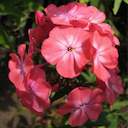

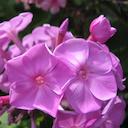

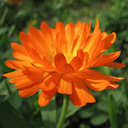

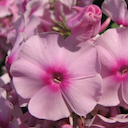

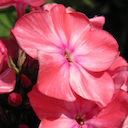

...

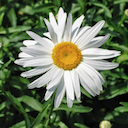

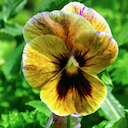

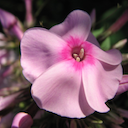

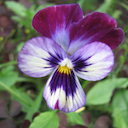

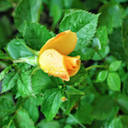

In [10]:
for photo in Photos:    
    display.display(photo)


What dimension do we need? With 20% error and 99% success:

In [11]:
dimensionNeeded(210,0.2,0.01)

895.6405113951757

It is hard to view things in 896 dimensions, so before I run things for real, I use JL to map the images down to 2D.

In [12]:
jl=JL(65536,2)
PhotoDataJL=list(map(jl.transform,PhotoData))

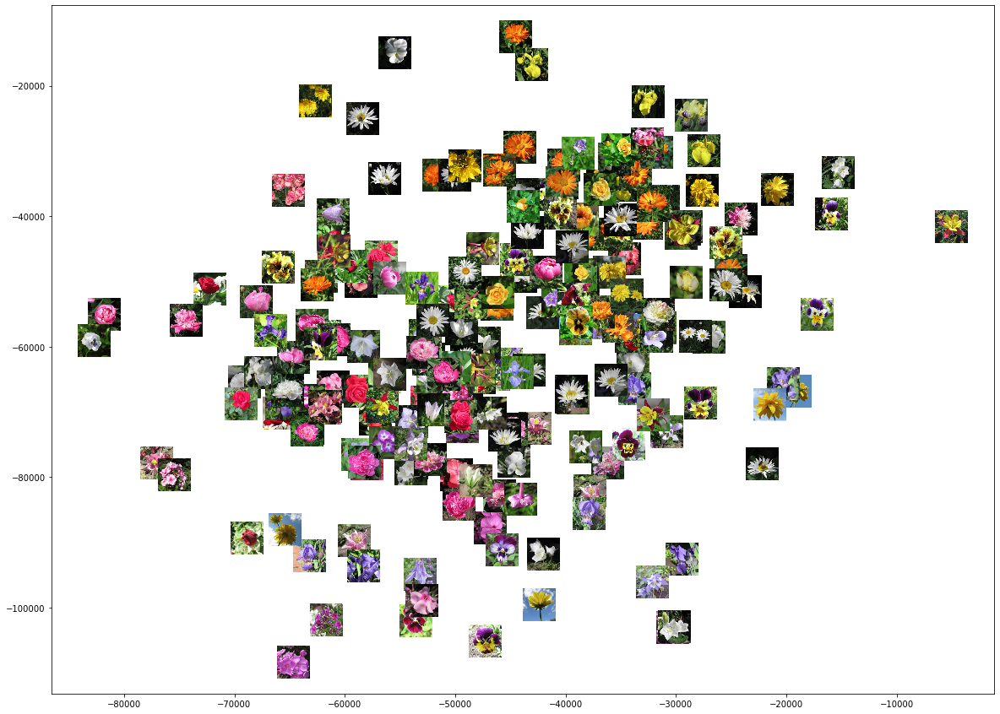

In [13]:
x = [x[0] for x in PhotoDataJL]
y = [x[1] for x in PhotoDataJL]

fig, ax = plt.subplots(figsize=(20, 15))
ax.scatter(x, y) 

for x0, y0, f in zip(x, y,flowerfilenames()):
    ab = AnnotationBbox(OffsetImage(plt.imread(f),zoom=0.3), (x0, y0), frameon=False)
    ax.add_artist(ab)

And just for fun, run $k$-means

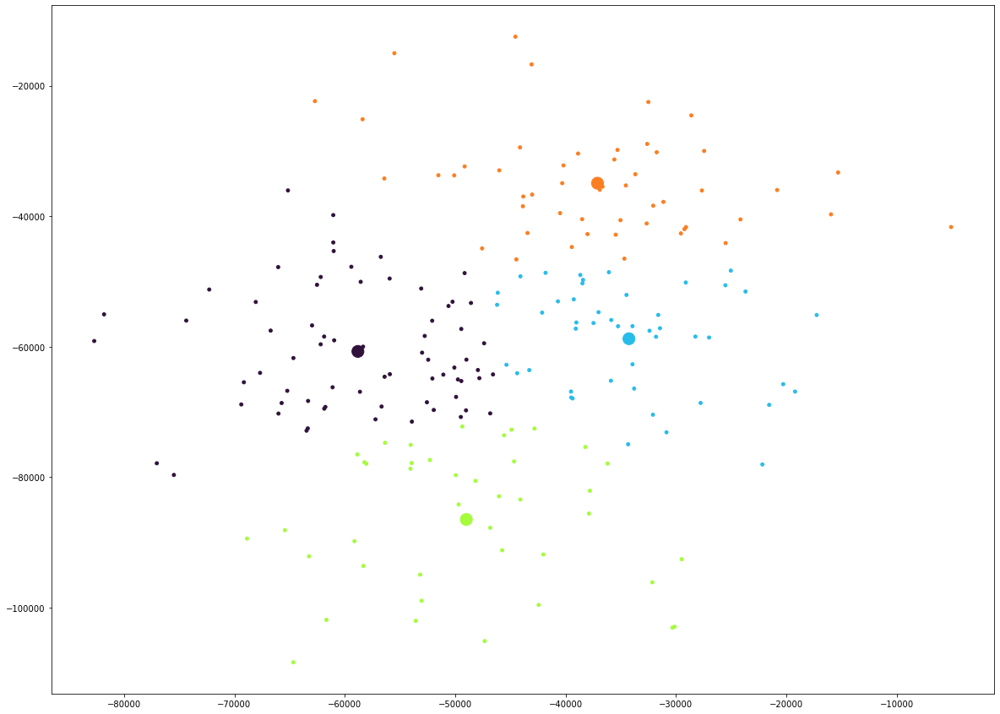

In [14]:
plotkmeans(PhotoDataJL,4,100,20)       

Now, let's try for real. I am going to use the recommended 895 dimensions. In class I used 100 and the results were not great, but with 895, I see three groups which look pretty good. 

In [15]:
jl=JL(65536,895)
PhotoDataJL2=list(map(jl.transform,PhotoData))

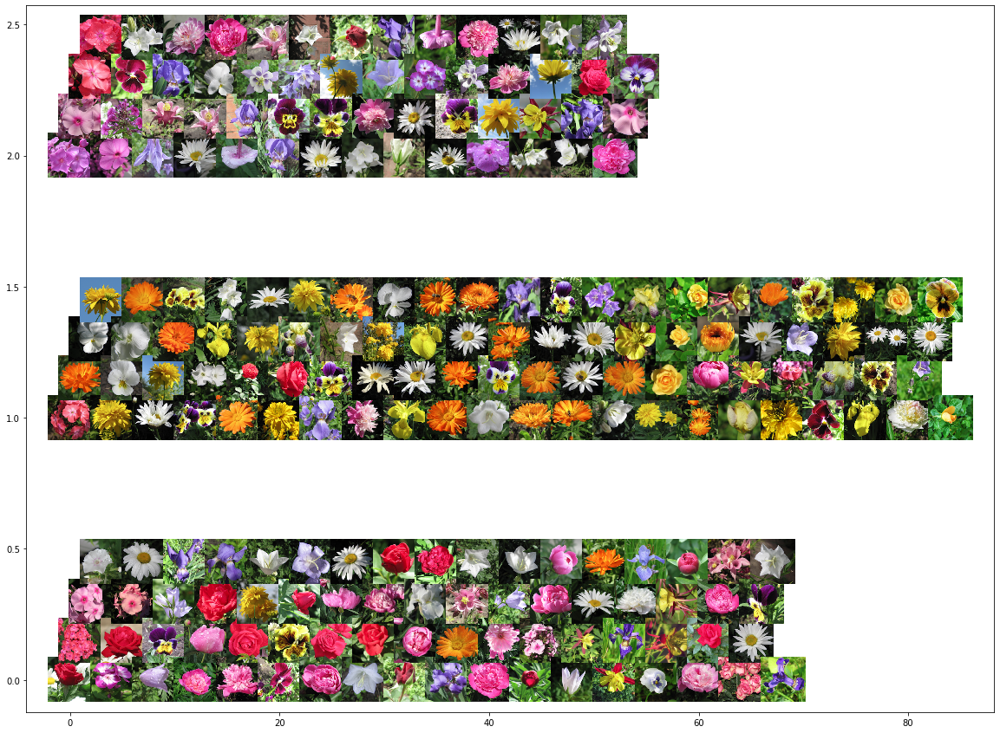

In [18]:
k=3
km,pwkm=repeatkmeans(PhotoDataJL,k,trials=10,iterations=10)

x=[0]*len(PhotoDataJL)
y=[0]*len(PhotoDataJL)
for kk in range(k):
    j=0
    for i in pwkm[kk]:
        y[i]=kk+j%4*0.15
        x[i]=j
        j+=1
        
fig, ax = plt.subplots(figsize=(20, 15))
ax.scatter(x, y) 


for x0, y0, f in zip(x, y,flowerfilenames()):
    ab = AnnotationBbox(OffsetImage(plt.imread(f),zoom=0.4), (x0, y0), frameon=False)
    ax.add_artist(ab)

Given $n$ documents, each $d$ dimensions, running JL to reduce to $k=\log n$ dimensions takes time $O(ndk)=O(d n \log n )$ Running $k$-means then takes time $O(knx\log n)$, where $x$ is the number of trials times the average time to converge. 
